In [1]:
import cv2
import glob
import numpy as np
from skimage import io
from scipy import ndimage
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2
from venomai import unet, predictor, preprocess

target_res = 5 # pixels per mm

# Analyze specific

0/6


Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_0.ckpt`
C:\Users\Billy\miniconda3\envs\venomai\lib\site-packages\torch\nn\modules\conv.py:459: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\Convolution.cpp:1004.)
  return F.conv2d(input, weight, bias, self.stride,
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_1.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to yo

0.0 0.0 0.0


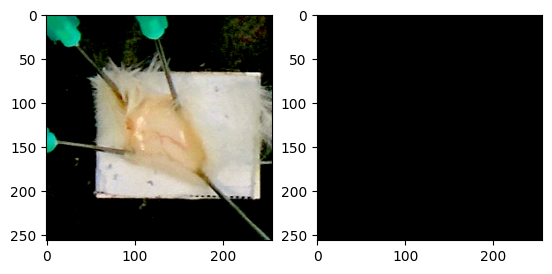

0.0 0.0 0.0


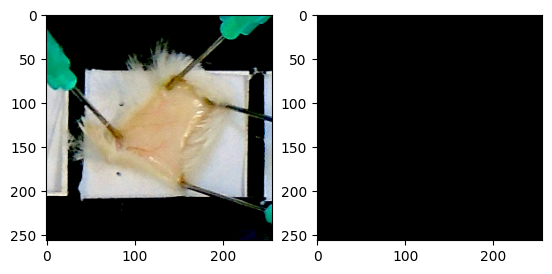

1/6


Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_0.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_1.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_2.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NER

0.0 0.0 0.0


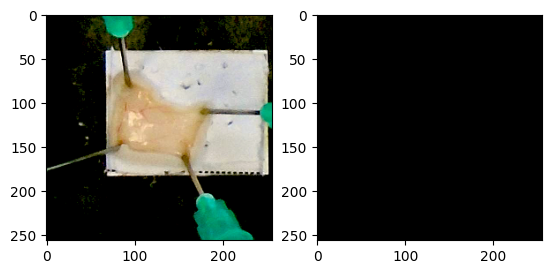

2/6


Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_0.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_1.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_2.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NER

43.28 0.0 43.28


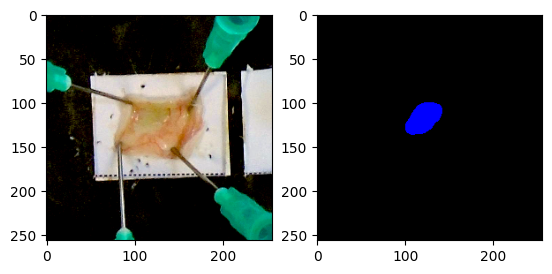

41.96 0.0 41.96


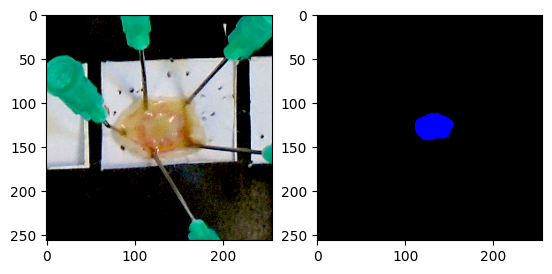

3/6


Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_0.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_1.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_2.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NER

71.0 0.0 71.0


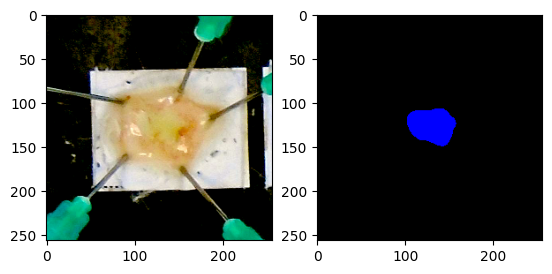

4/6


Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_0.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_1.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_2.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NER

33.08 12.84 58.97828


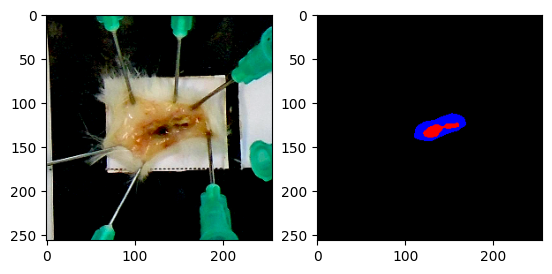

63.04 55.8 175.58859999999999


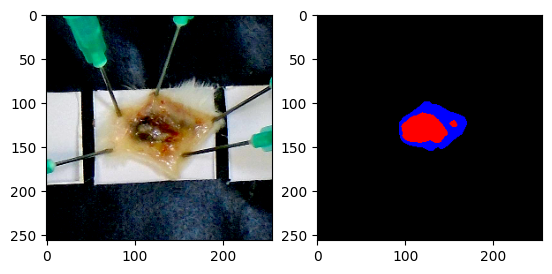

5/6


Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_0.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_1.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NERD-Experiments\models\unet_inference_2.ckpt`
Lightning automatically upgraded your loaded checkpoint from v1.5.10 to v2.0.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file D:\Work\venom-ai\NER

41.24 44.6 131.1982


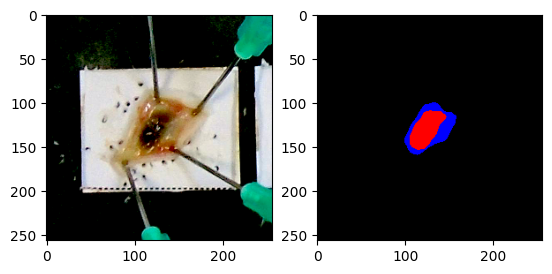

60.24 21.08 102.75836


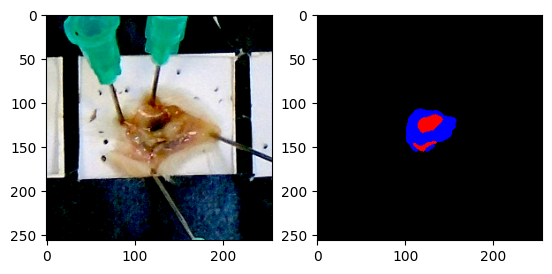

In [2]:
image_files = np.sort(glob.glob('data/raw/images/*.jpg'))
target_files = np.sort(glob.glob('data/raw/targets/*.jpg'))

idx = [79,126,96,129,16,65]
image_files = image_files[idx]
target_files = target_files[idx]

for i in range(len(image_files)):
    
    print(f'{i}/{len(image_files)}')
    
    # Load original image
    image = io.imread(image_files[i])
    target = io.imread(target_files[i])
    
    # Convert to linear RGB color space
    image = preprocess.srgb_to_linear(image)
    
    # Apply automatic white balancing
    image = preprocess.auto_white_balance(image)
    
    # Apply template white balancing
    inner_area=10**2
    black_square = preprocess.find_black_square(image[int(image.shape[0]/2):,:,:])
    white_point, black_point, pixel_resolution = preprocess.compute_square_info([black_square], inner_area=inner_area)
    
    image = preprocess.white_balance(image, white_point, black_point)
    
    # Convert back to gamma RGB color space
    image = preprocess.linear_to_srgb(image)
    
    # Rescale image to have a resolution of 5 pixels per mm
    image = preprocess.rescale_image(image, pixel_resolution, target_res=target_res, interpolation=cv2.INTER_CUBIC)
    target = preprocess.rescale_image(target, pixel_resolution, target_res=target_res, interpolation=cv2.INTER_CUBIC)
    target = ((np.mean(target,-1) / 255) > 0.5)
    
    # Get patch centers
    labels, _ = ndimage.label(target)
    objs = ndimage.find_objects(labels)
    centers = []
    for n in range(len(objs)):
        center_x = int((objs[n][0].stop - objs[n][0].start) / 2) + objs[n][0].start
        center_y = int((objs[n][1].stop - objs[n][1].start) / 2) + objs[n][1].start
        centers.append([center_x, center_y])
    centers = np.array(centers)
    centers = centers[centers[:, 1].argsort()]
    
    # Segment patches
    final_predictions = None
    for j in range(5):
        model = unet.UNet.load_from_checkpoint(f'models/unet_inference_{j}.ckpt')
        predictions, windows = predictor.predict_image(model, image, centers=centers, apply_preprocessing=False)
        if j == 0:
            final_predictions = predictions
        else:
            final_predictions += predictions
    predictions = final_predictions / 5
    
    # Compute areas and necrotic units
    nus, light_real_areas, dark_real_areas = predictor.compute_necrotic_units(predictions, windows, return_stats=True)
    
    # Display segmentations
    masks = np.zeros((windows.shape[0], windows.shape[1], windows.shape[2], 3))
    masks[:,:,:,0] = (np.argmax(predictions, 1) == 2)
    masks[:,:,:,2] = (np.argmax(predictions, 1) == 1)
    masks = (masks * 255).astype('uint8')
    for j in range(masks.shape[0]):
        print(light_real_areas[j], dark_real_areas[j], nus[j])
        fig, (ax1, ax2) = plt.subplots(1, 2)
        ax1.imshow(windows[j])
        ax2.imshow(masks[j])
        
        plt.show()

# Analyze all

0/193


C:\Users\Billy\anaconda3\envs\venom-ai\lib\site-packages\torch\nn\modules\conv.py:443: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\Convolution.cpp:744.)
  return F.conv2d(input, weight, bias, self.stride,
C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/0_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


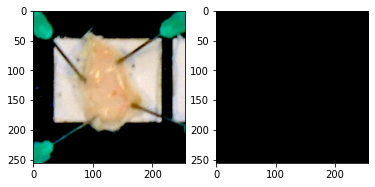

1/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/1_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


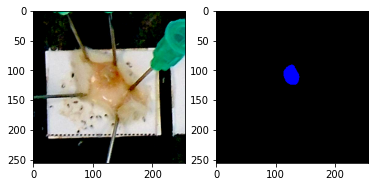

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/1_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


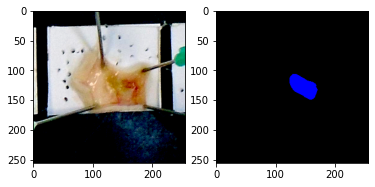

2/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/2_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


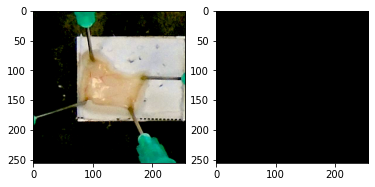

3/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/3_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


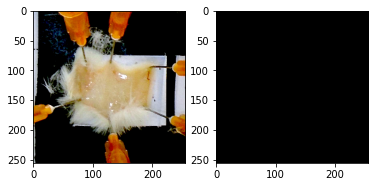

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/3_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


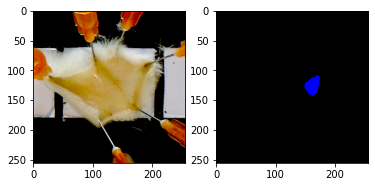

4/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/4_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


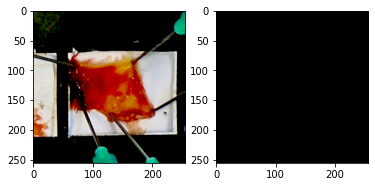

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/4_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


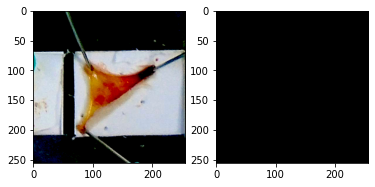

5/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/5_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


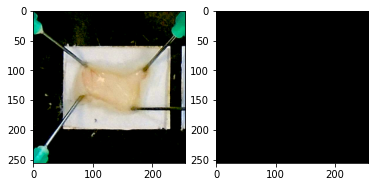

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/5_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


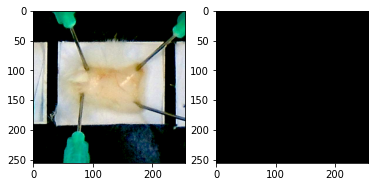

6/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/6_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


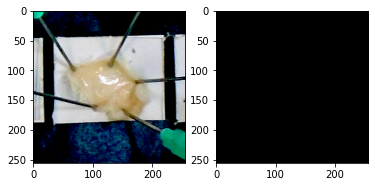

7/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/7_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


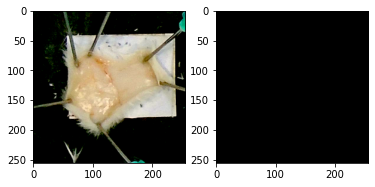

8/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/8_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


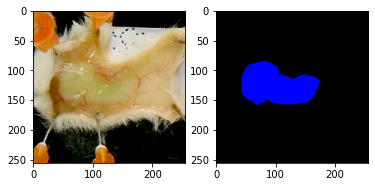

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/8_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


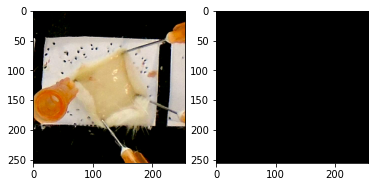

9/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/9_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


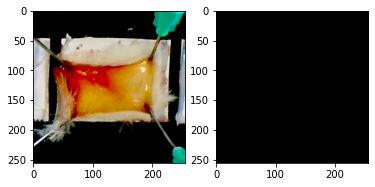

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/9_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


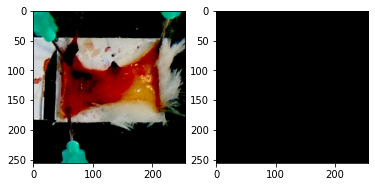

10/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/10_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


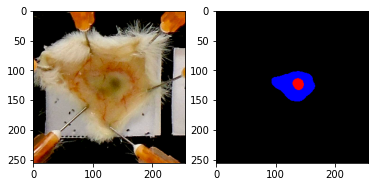

11/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/11_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


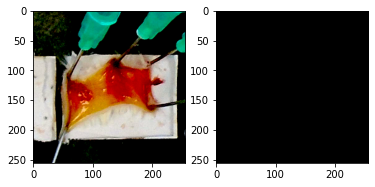

12/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/12_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


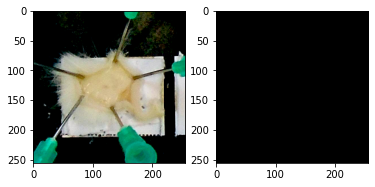

13/193


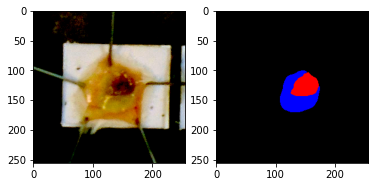

14/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/14_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


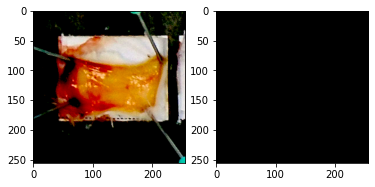

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/14_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


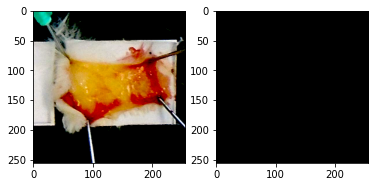

15/193


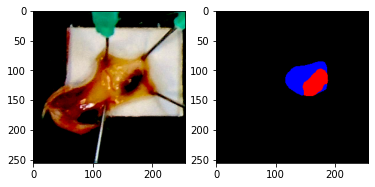

16/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/16_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


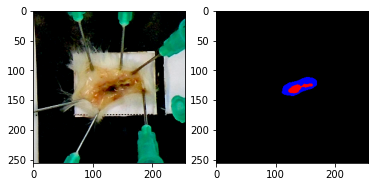

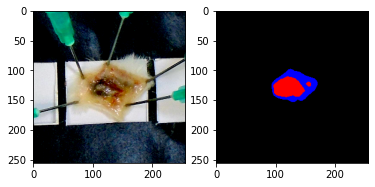

17/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/17_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


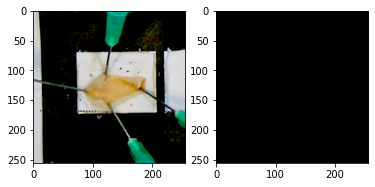

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/17_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


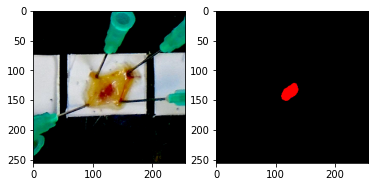

18/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/18_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


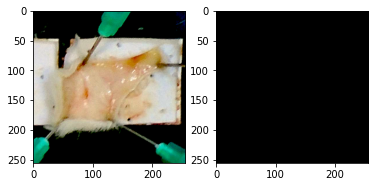

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/18_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


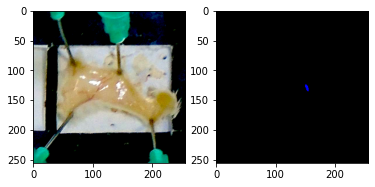

19/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/19_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


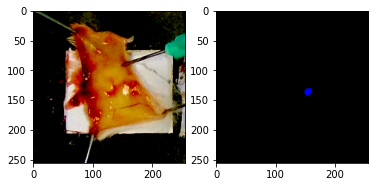

20/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/20_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


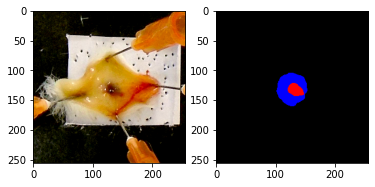

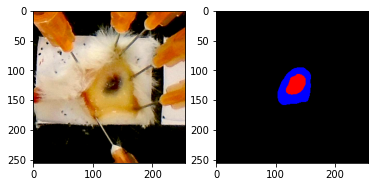

21/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/21_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


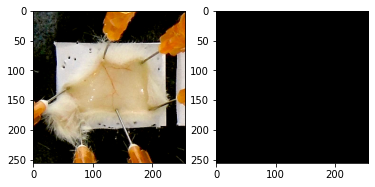

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/21_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


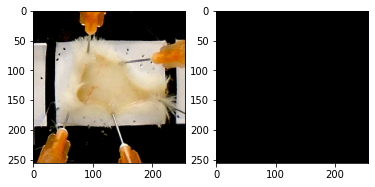

22/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/22_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


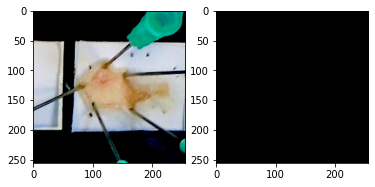

23/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/23_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


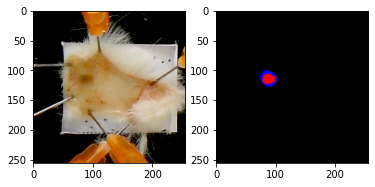

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/23_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


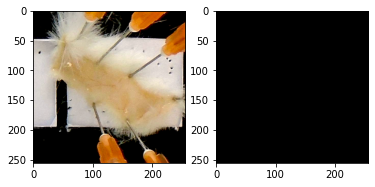

24/193


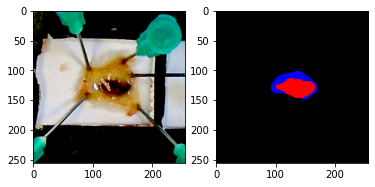

25/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/25_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


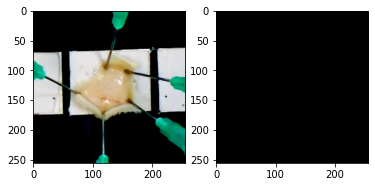

26/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/26_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


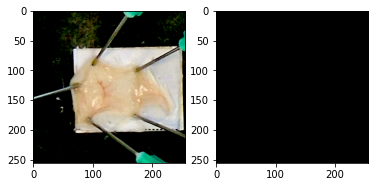

27/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/27_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


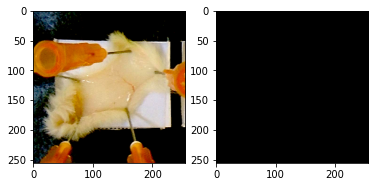

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/27_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


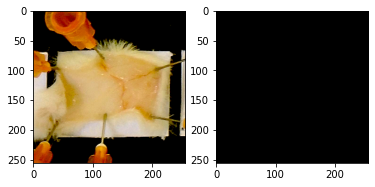

28/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/28_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


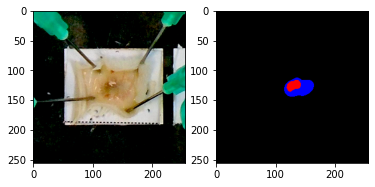

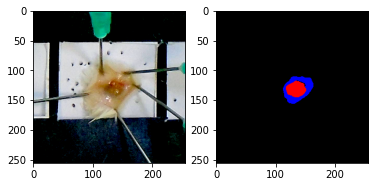

29/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/29_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


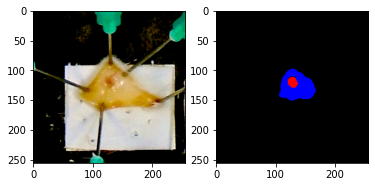

30/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/30_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


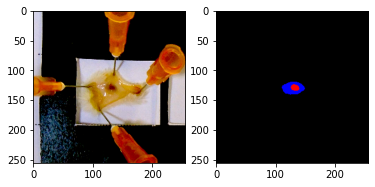

31/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/31_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


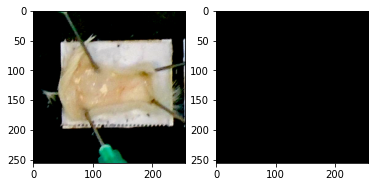

32/193


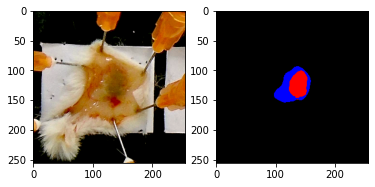

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/32_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


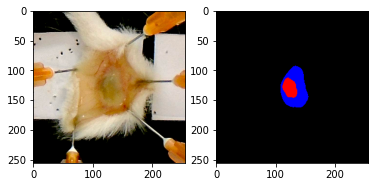

33/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/33_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


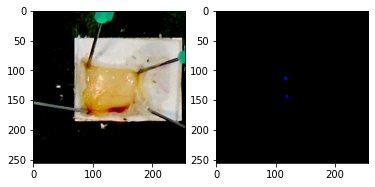

34/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/34_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


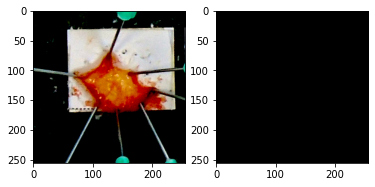

35/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/35_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


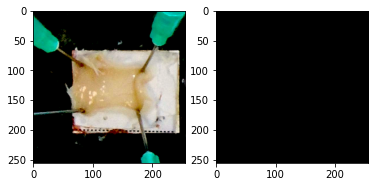

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/35_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


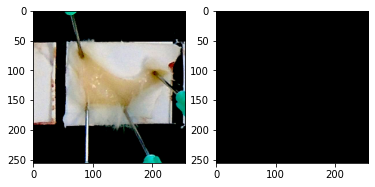

36/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/36_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


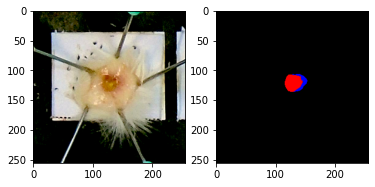

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/36_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


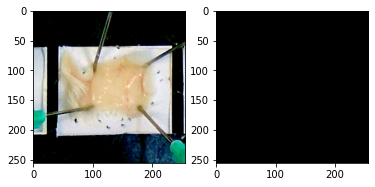

37/193


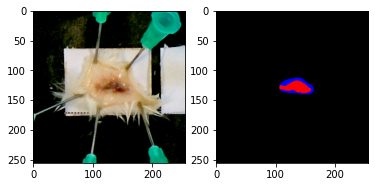

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/37_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


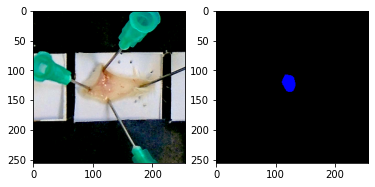

38/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/38_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


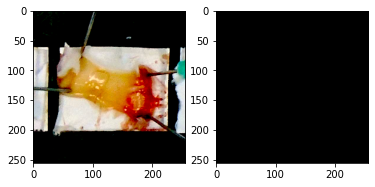

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/38_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


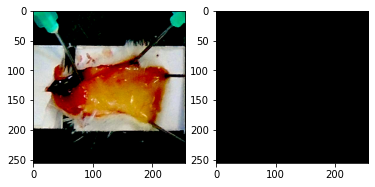

39/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/39_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


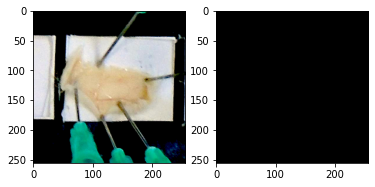

40/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/40_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


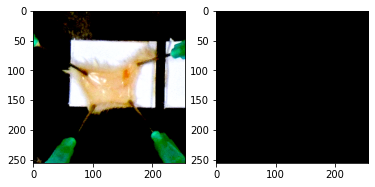

41/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/41_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


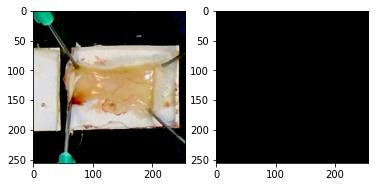

42/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/42_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


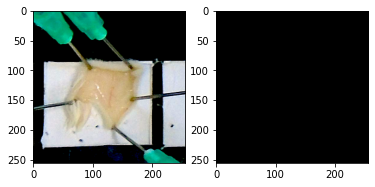

43/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/43_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


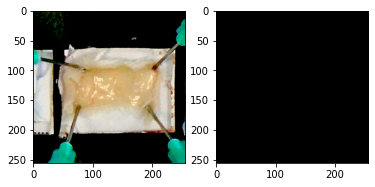

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/43_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


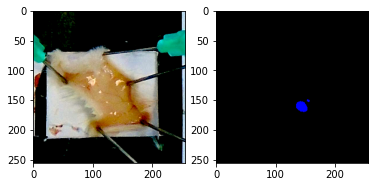

44/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/44_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


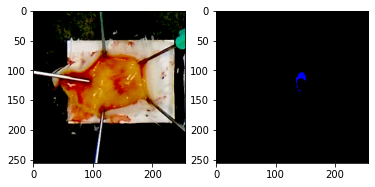

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/44_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


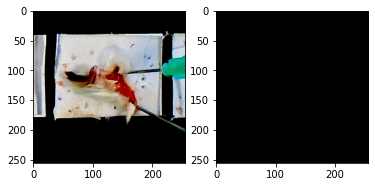

45/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/45_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


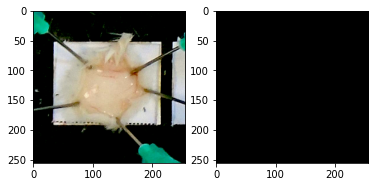

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/45_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


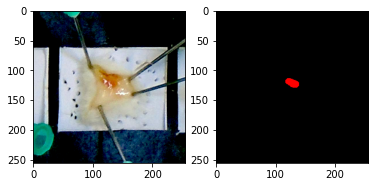

46/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/46_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


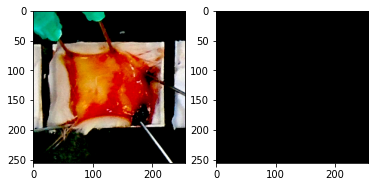

47/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/47_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


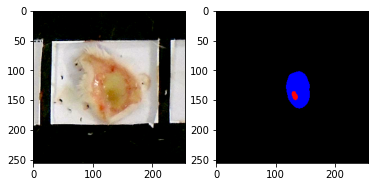

48/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/48_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


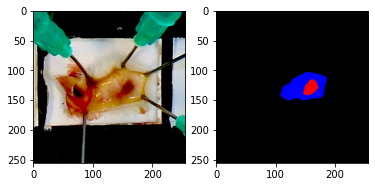

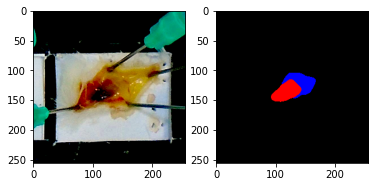

49/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/49_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


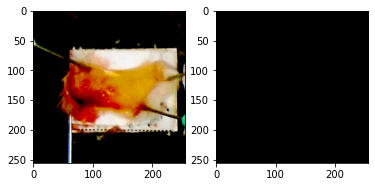

50/193


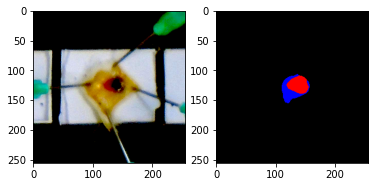

51/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/51_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


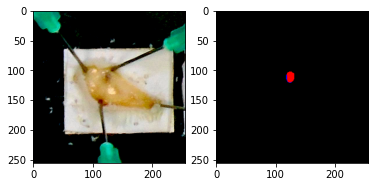

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/51_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


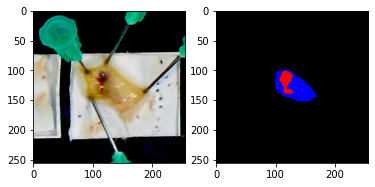

52/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/52_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


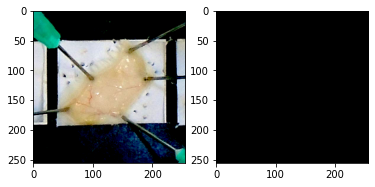

53/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/53_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


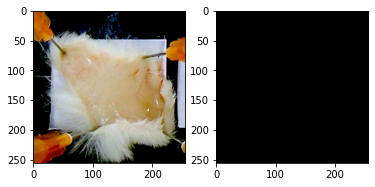

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/53_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


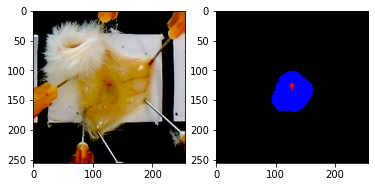

54/193


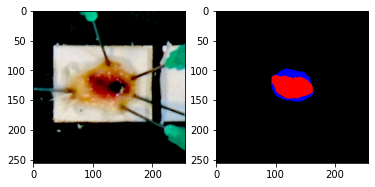

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/54_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


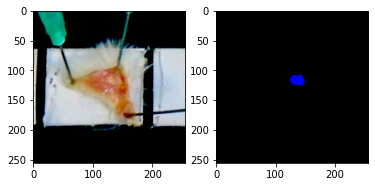

55/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/55_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


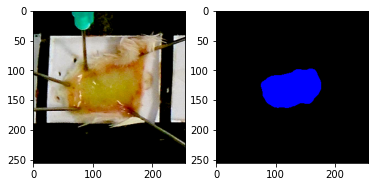

56/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/56_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


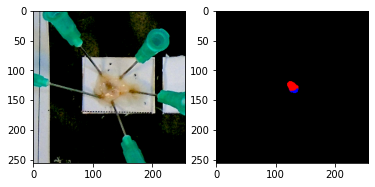

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/56_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


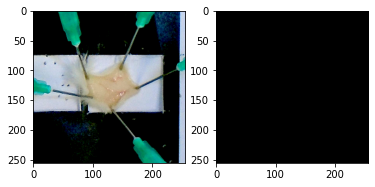

57/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/57_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


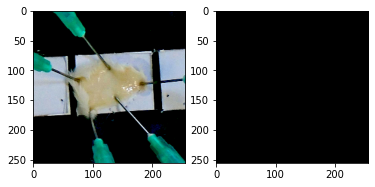

58/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/58_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


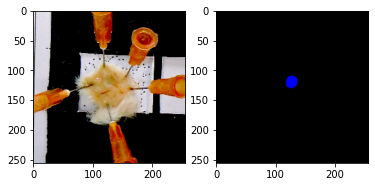

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/58_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


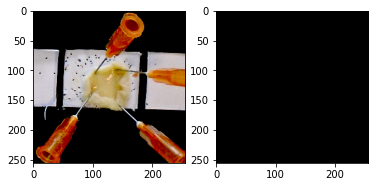

59/193


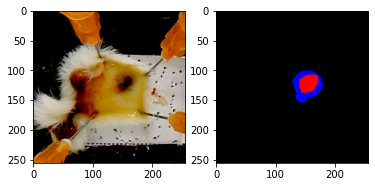

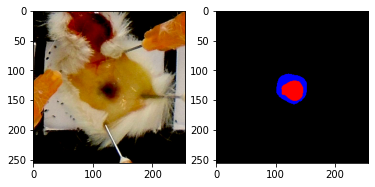

60/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/60_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


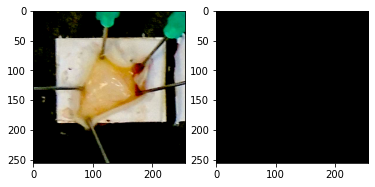

61/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/61_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


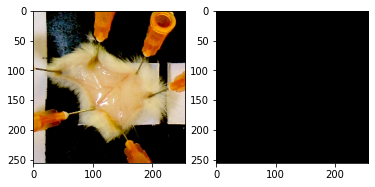

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/61_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


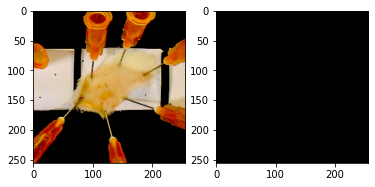

62/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/62_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


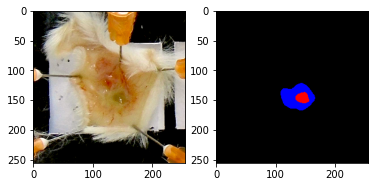

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/62_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


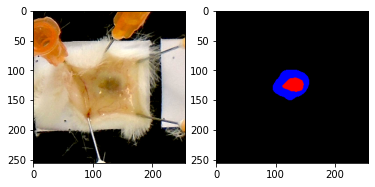

63/193


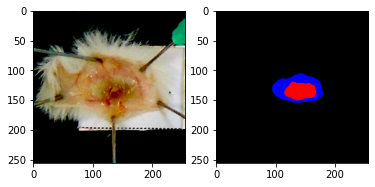

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/63_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


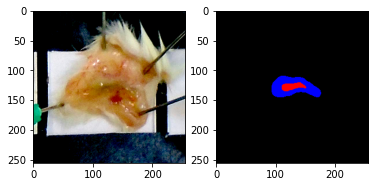

64/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/64_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


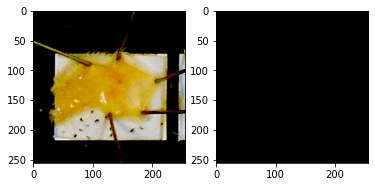

65/193


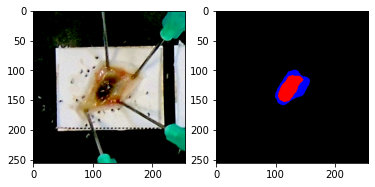

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/65_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


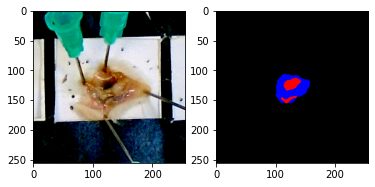

66/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/66_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


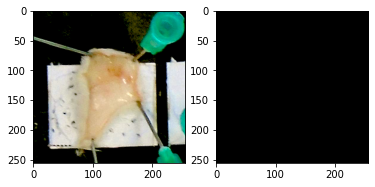

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/66_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


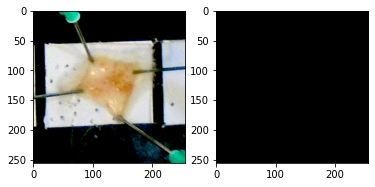

67/193


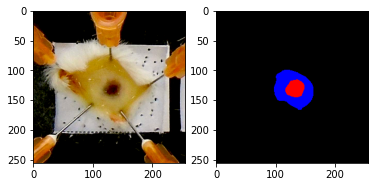

68/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/68_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


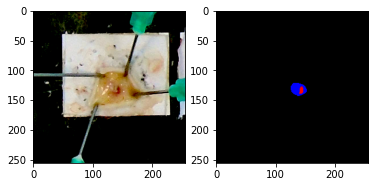

69/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/69_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


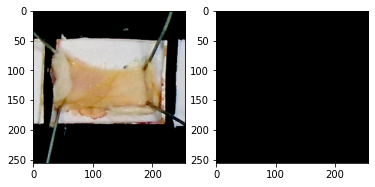

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/69_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


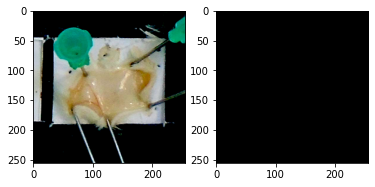

70/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/70_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


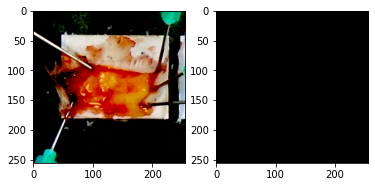

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/70_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


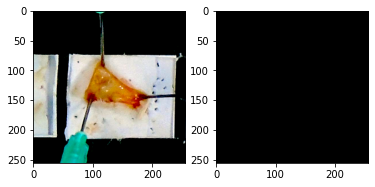

71/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/71_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


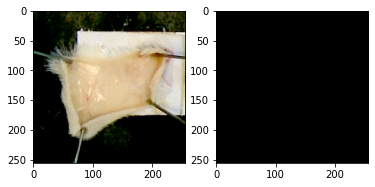

72/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/72_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


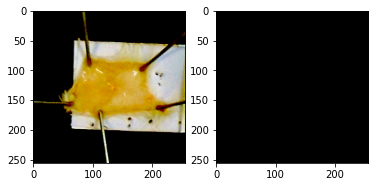

73/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/73_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


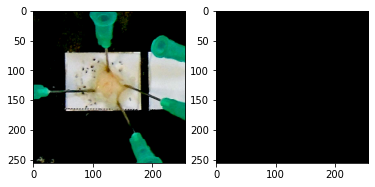

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/73_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


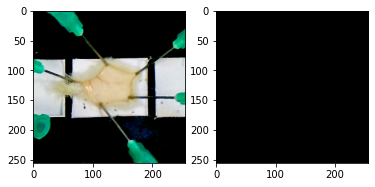

74/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/74_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


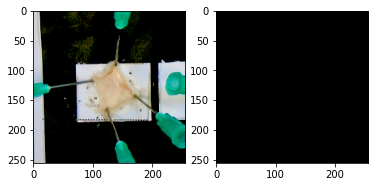

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/74_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


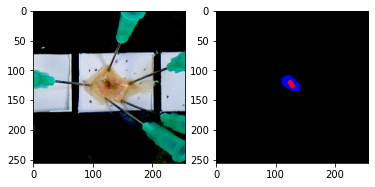

75/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/75_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


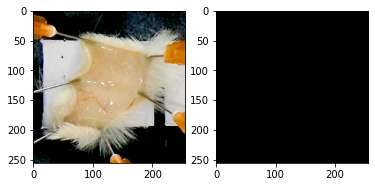

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/75_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


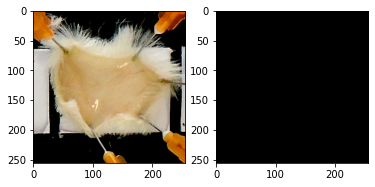

76/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/76_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


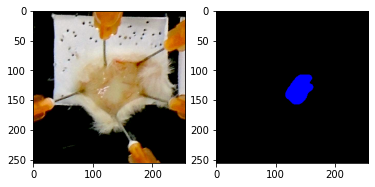

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/76_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


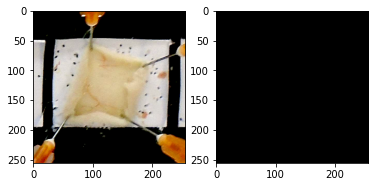

77/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/77_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


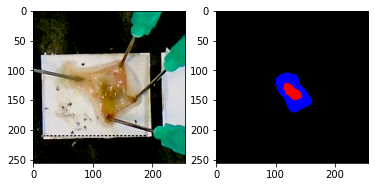

78/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/78_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


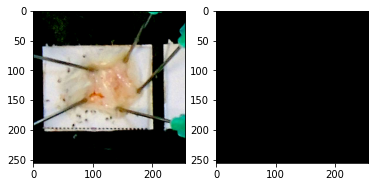

79/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/79_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


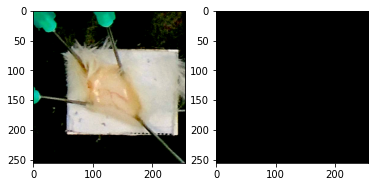

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/79_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


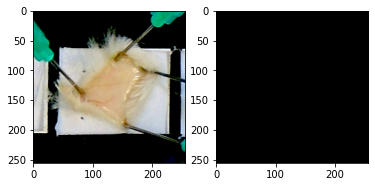

80/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/80_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


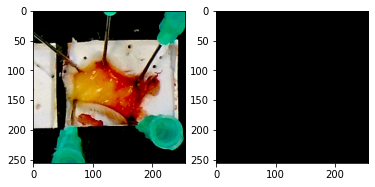

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/80_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


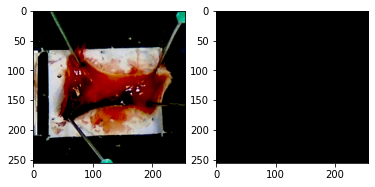

81/193


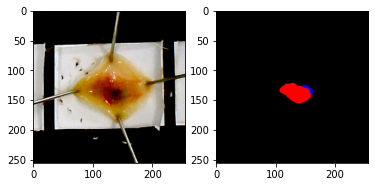

82/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/82_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


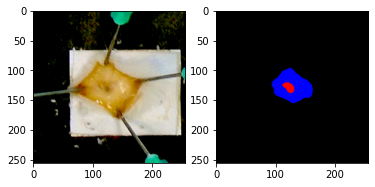

83/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/83_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


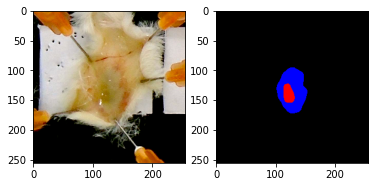

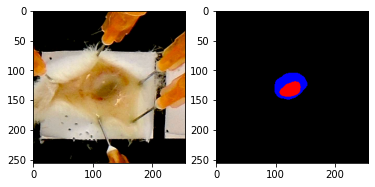

84/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/84_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


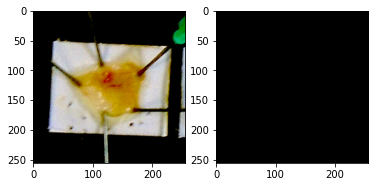

85/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/85_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


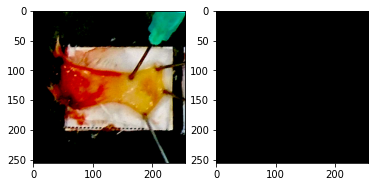

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/85_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


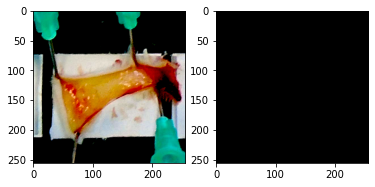

86/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/86_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


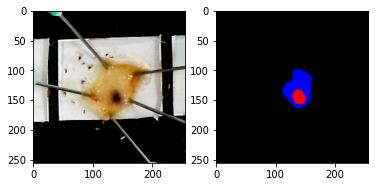

87/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/87_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


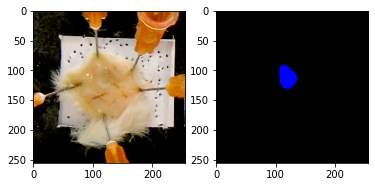

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/87_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


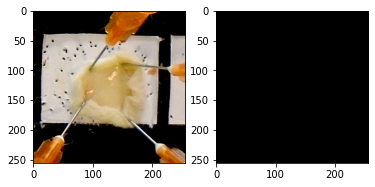

88/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/88_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


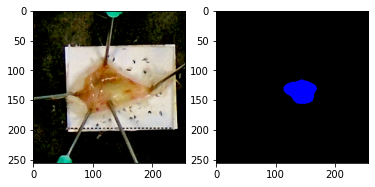

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/88_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


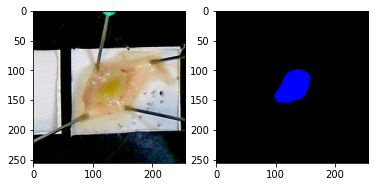

89/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/89_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


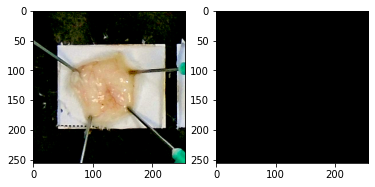

90/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/90_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


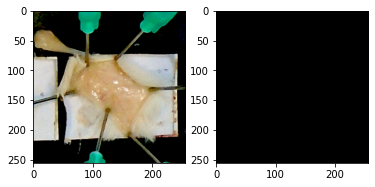

91/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/91_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


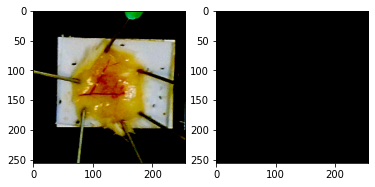

92/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/92_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


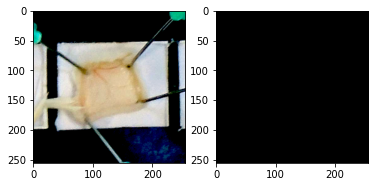

93/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/93_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


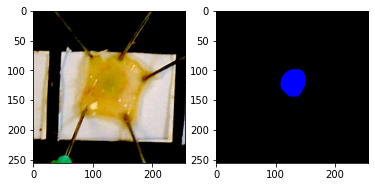

94/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/94_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


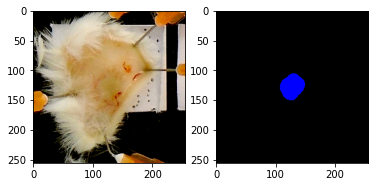

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/94_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


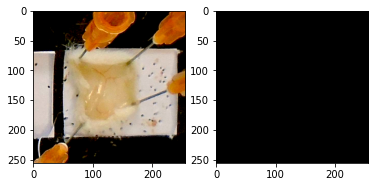

95/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/95_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


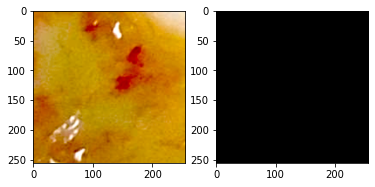

96/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/96_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


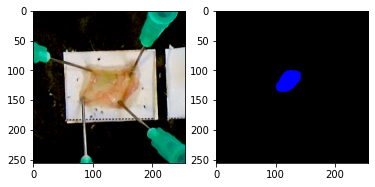

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/96_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


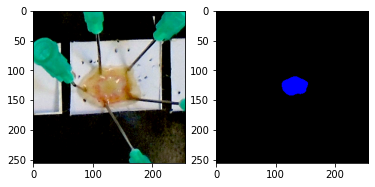

97/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/97_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


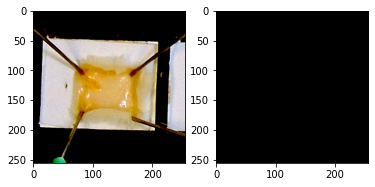

98/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/98_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


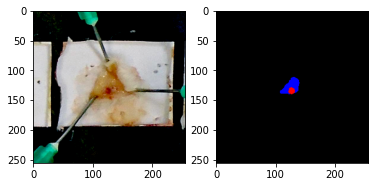

99/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/99_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


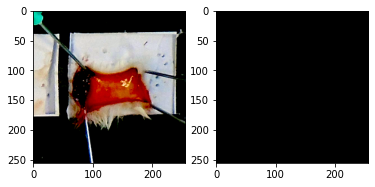

100/193


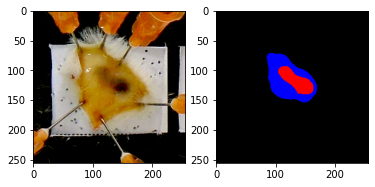

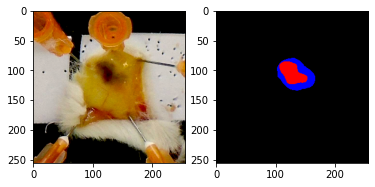

101/193


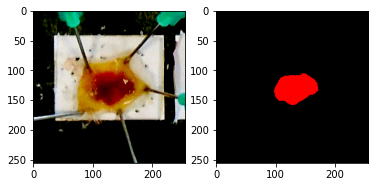

102/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/102_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


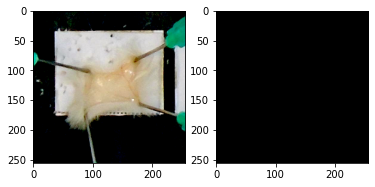

103/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/103_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


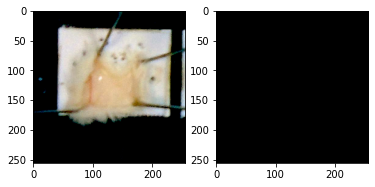

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/103_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


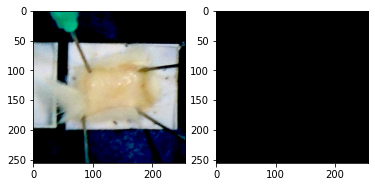

104/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/104_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


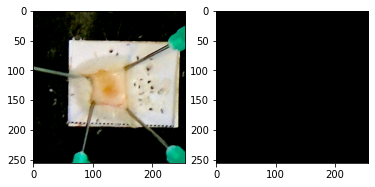

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/104_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


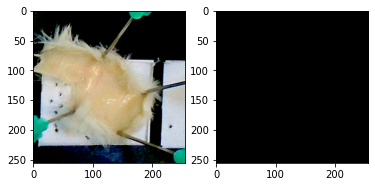

105/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/105_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


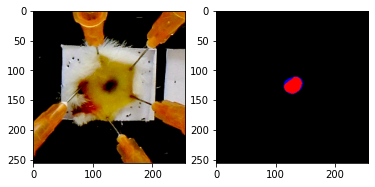

106/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/106_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


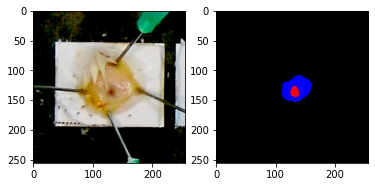

107/193


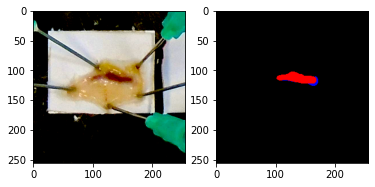

108/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/108_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


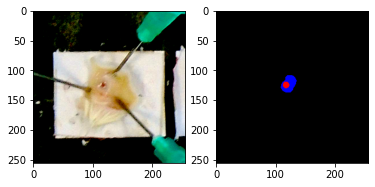

109/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/109_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


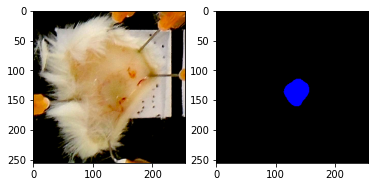

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/109_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


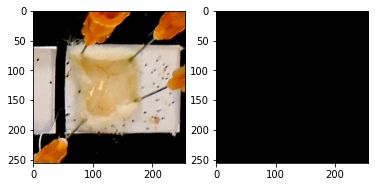

110/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/110_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


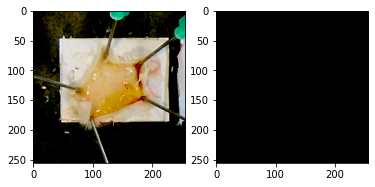

111/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/111_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


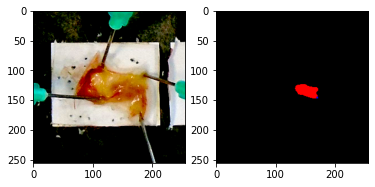

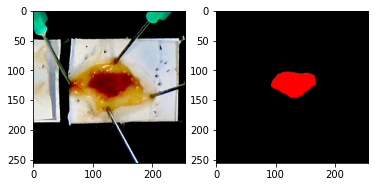

112/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/112_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


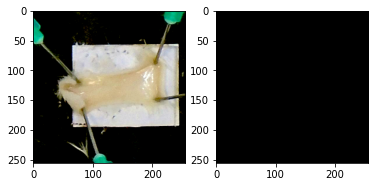

113/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/113_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


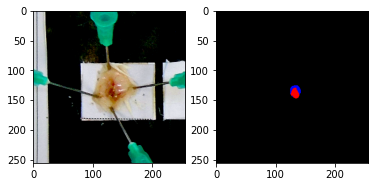

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/113_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


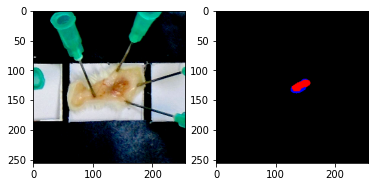

114/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/114_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


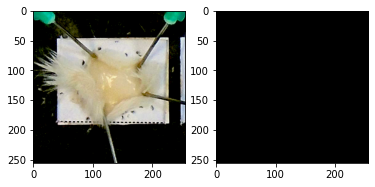

115/193


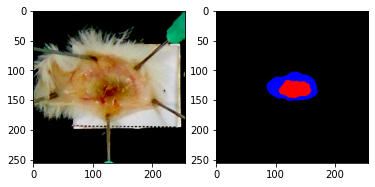

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/115_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


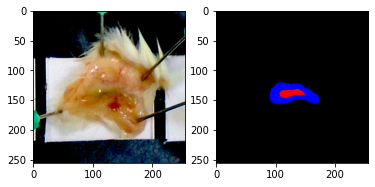

116/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/116_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


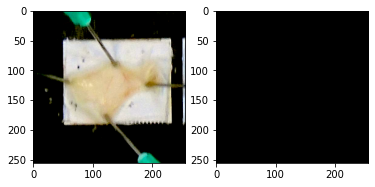

117/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/117_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


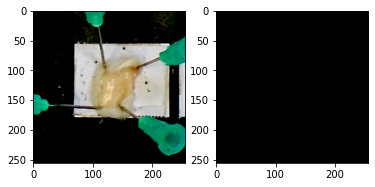

118/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/118_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


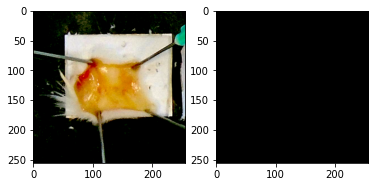

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/118_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


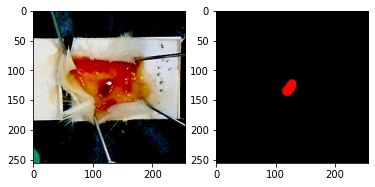

119/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/119_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


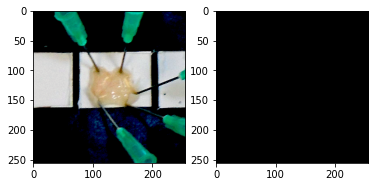

120/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/120_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


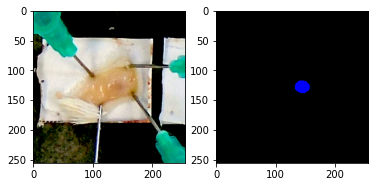

121/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/121_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


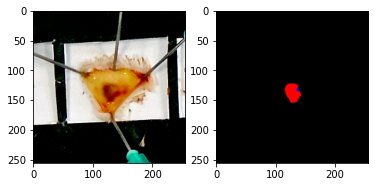

122/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/122_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


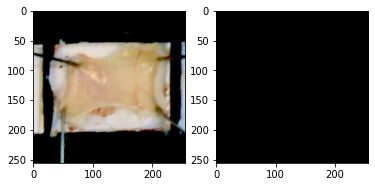

123/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/123_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


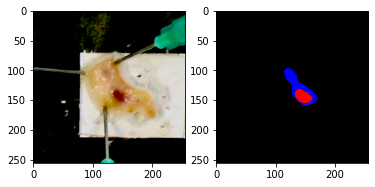

124/193


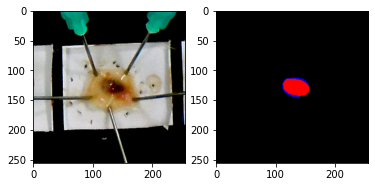

125/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/125_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


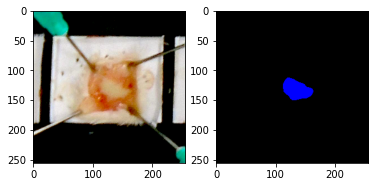

126/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/126_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


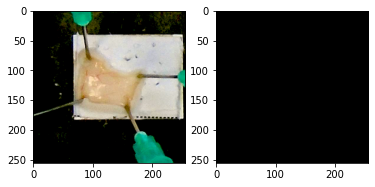

127/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/127_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


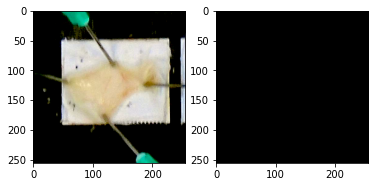

128/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/128_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


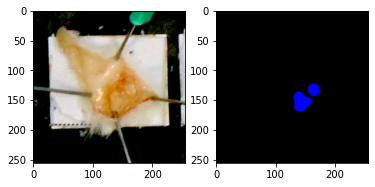

129/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/129_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


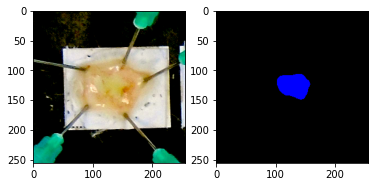

130/193


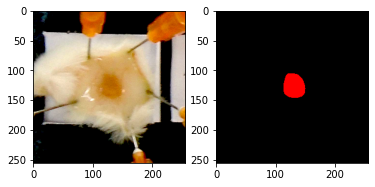

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/130_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


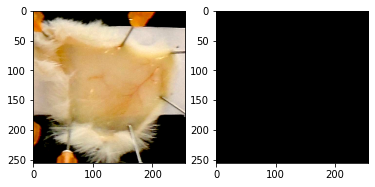

131/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/131_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


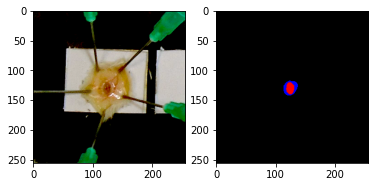

132/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/132_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


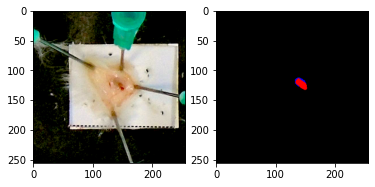

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/132_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


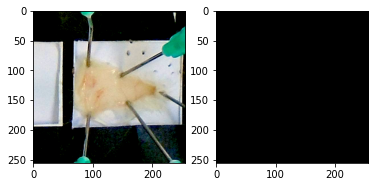

133/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/133_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


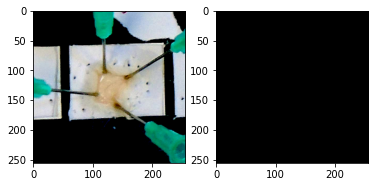

134/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/134_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


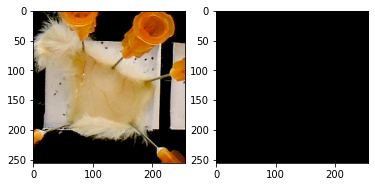

135/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/135_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


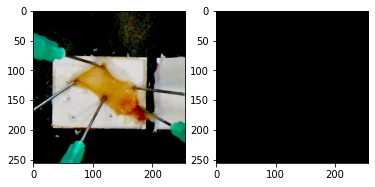

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/135_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


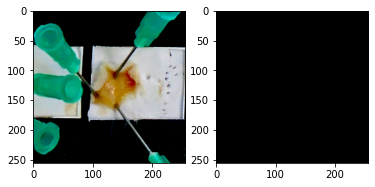

136/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/136_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


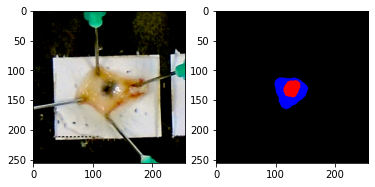

137/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/137_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


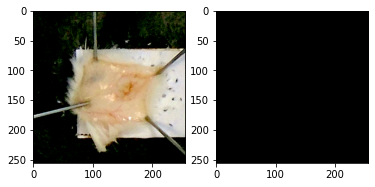

138/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/138_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


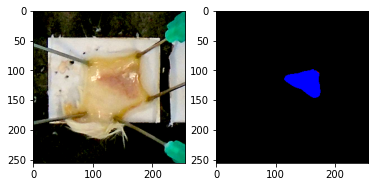

139/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/139_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


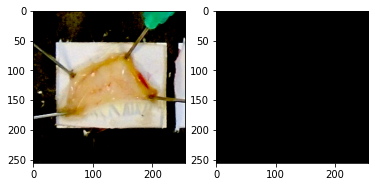

140/193


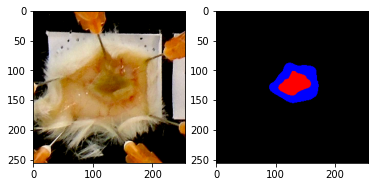

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/140_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


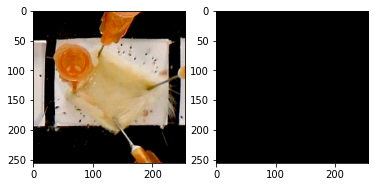

141/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/141_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


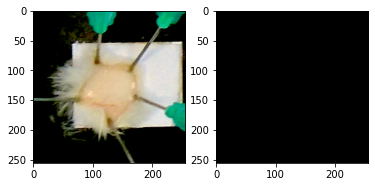

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/141_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


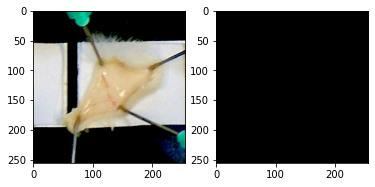

142/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/142_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


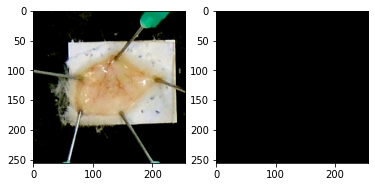

143/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/143_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


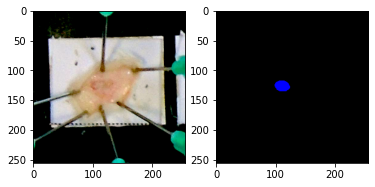

144/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/144_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


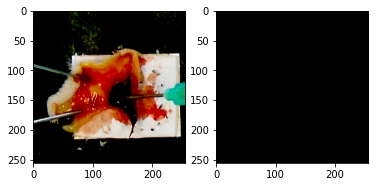

145/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/145_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


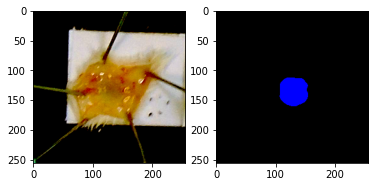

146/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/146_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


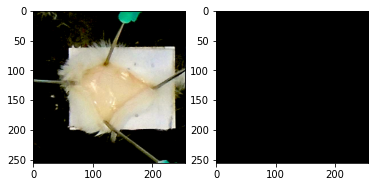

147/193


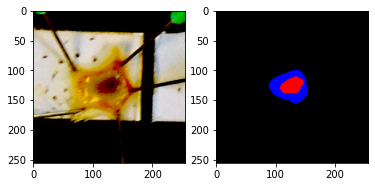

148/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/148_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


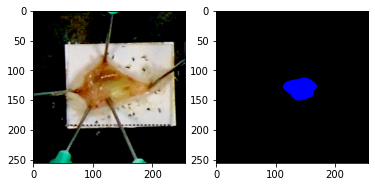

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/148_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


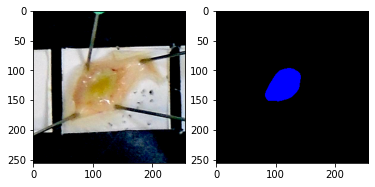

149/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/149_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


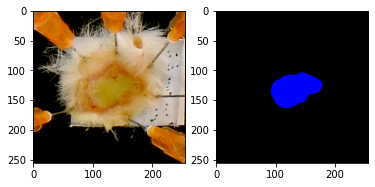

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/149_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


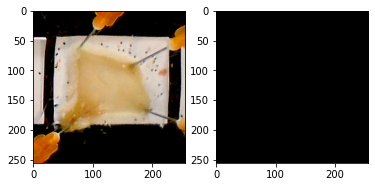

150/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/150_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


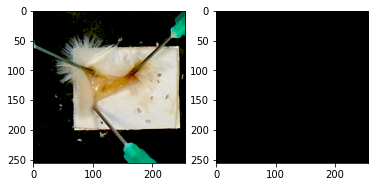

151/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/151_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


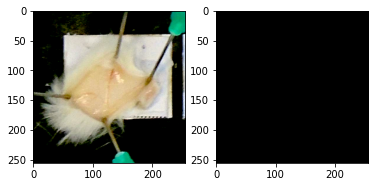

152/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/152_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


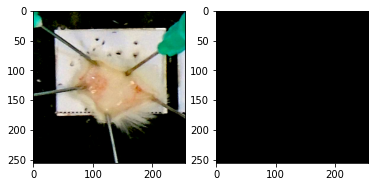

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/152_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


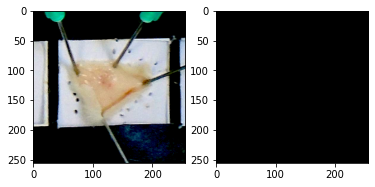

153/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/153_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


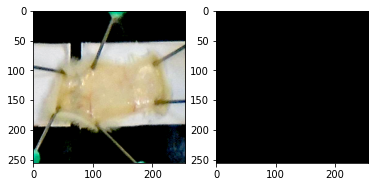

154/193


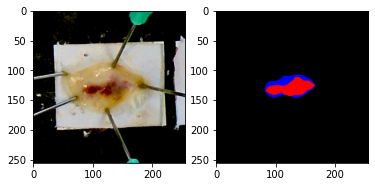

155/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/155_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


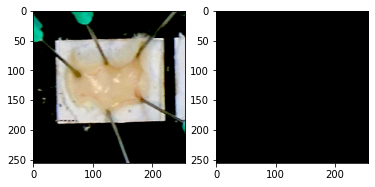

156/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/156_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


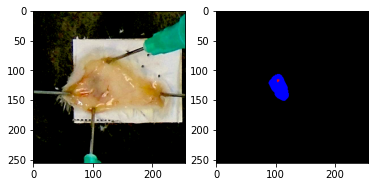

157/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/157_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


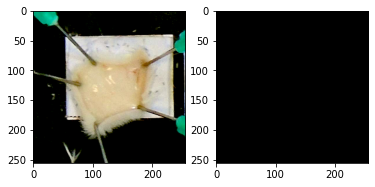

158/193


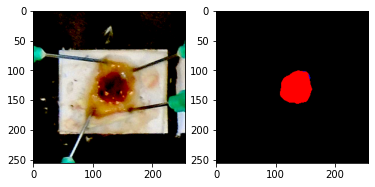

159/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/159_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


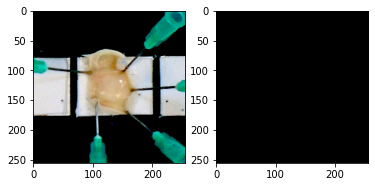

160/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/160_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


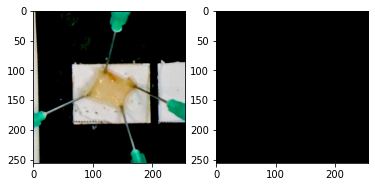

161/193


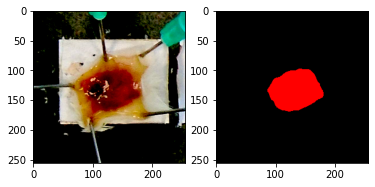

162/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/162_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


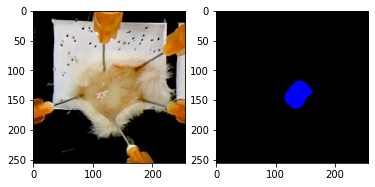

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/162_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


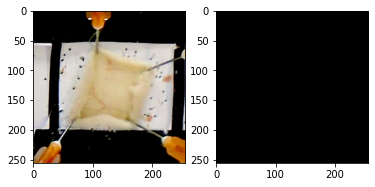

163/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/163_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


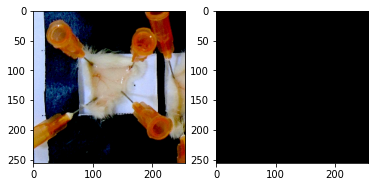

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/163_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


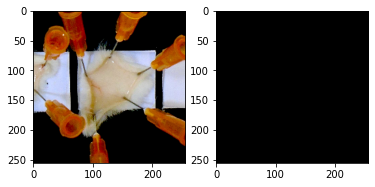

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/163_2_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


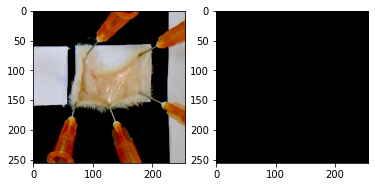

164/193


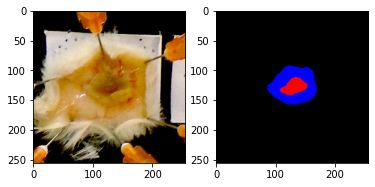

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/164_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


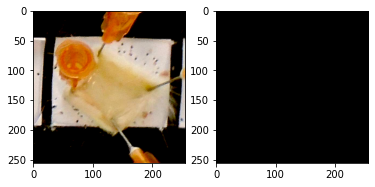

165/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/165_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


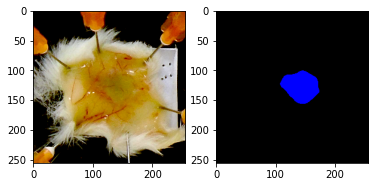

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/165_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


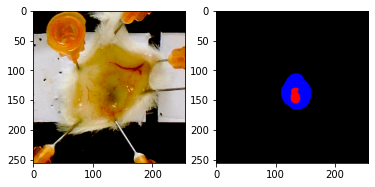

166/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/166_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


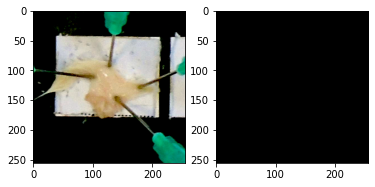

167/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/167_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


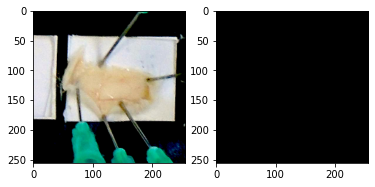

168/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/168_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


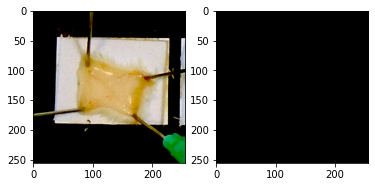

169/193


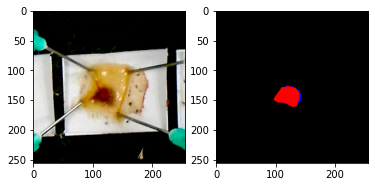

170/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/170_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


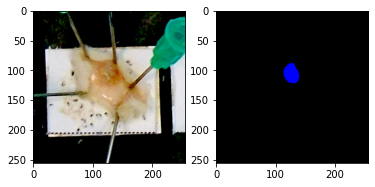

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/170_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


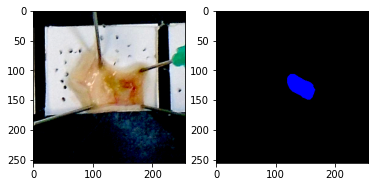

171/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/171_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


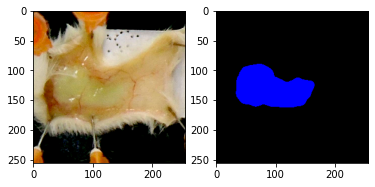

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/171_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


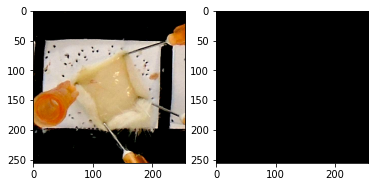

172/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/172_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


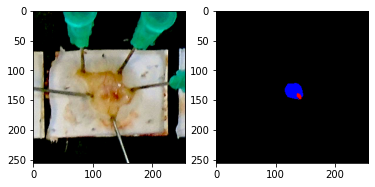

173/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/173_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


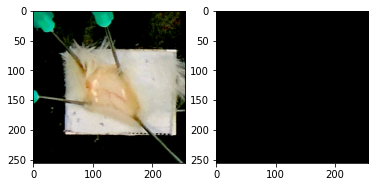

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/173_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


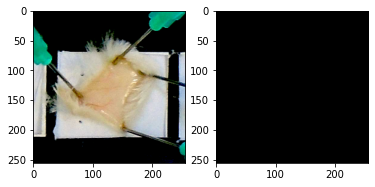

174/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/174_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


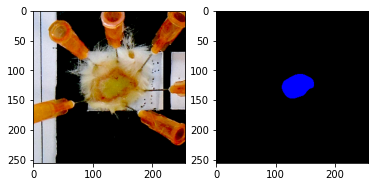

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/174_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


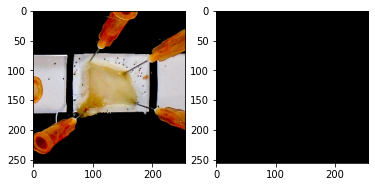

175/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/175_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


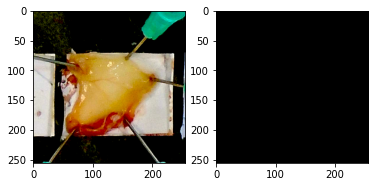

176/193


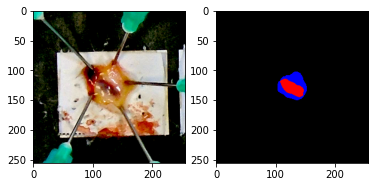

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/176_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


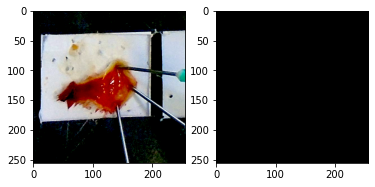

177/193


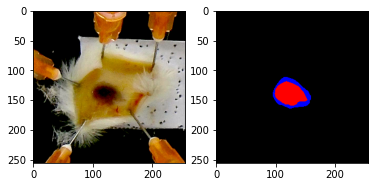

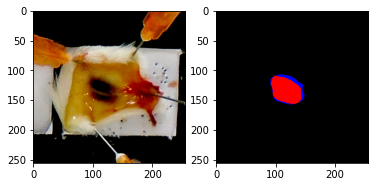

178/193


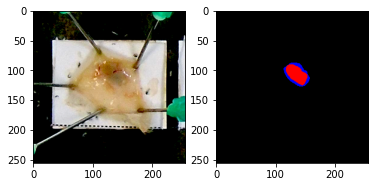

179/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/179_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


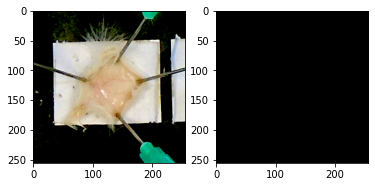

180/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/180_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


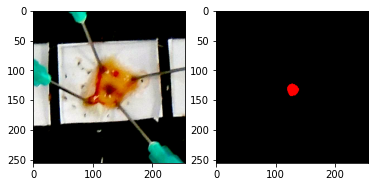

181/193


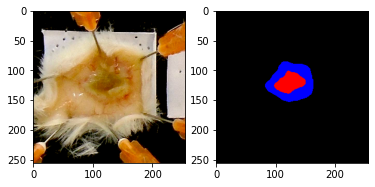

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/181_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


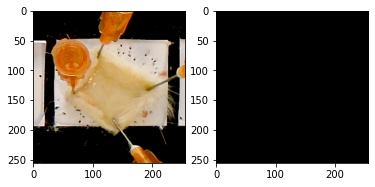

182/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/182_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


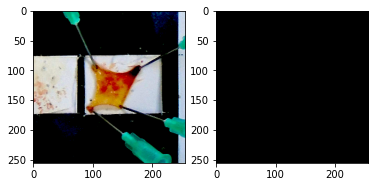

183/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/183_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


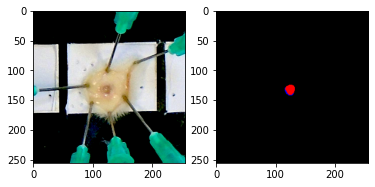

184/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/184_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


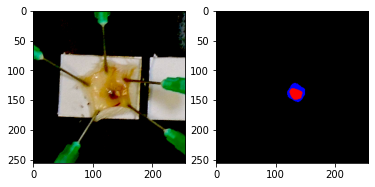

185/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/185_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


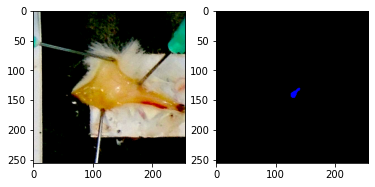

186/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/186_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


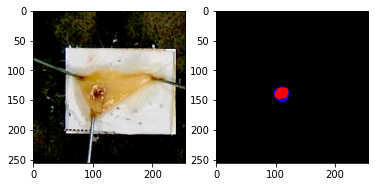

187/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/187_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


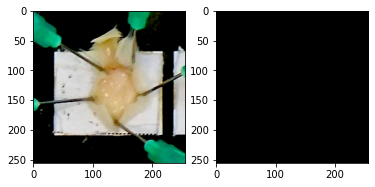

188/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/188_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


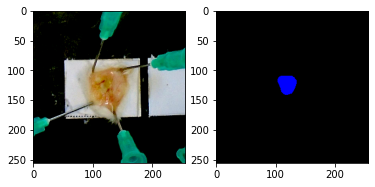

C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/188_1_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


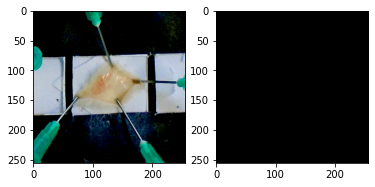

189/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/189_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


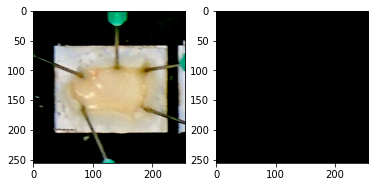

190/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/190_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


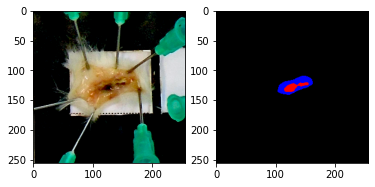

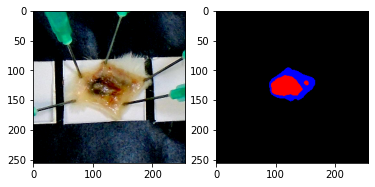

191/193


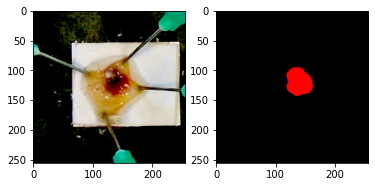

192/193


C:\Users\Billy\AppData\Local\Temp\ipykernel_24536\3376909132.py:70: UserWarning: figures/segmentations/192_0_mask.png is a low contrast image
  io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))


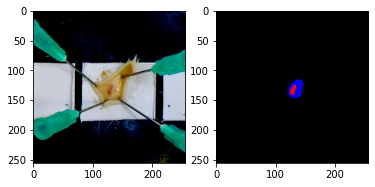

In [2]:
output = []

image_files = np.sort(glob.glob('data/raw/images/*.jpg'))
target_files = np.sort(glob.glob('data/raw/targets/*.jpg'))

images = []

for i in range(len(image_files)):
    
    print(f'{i}/{len(image_files)}')
    
    # Load original image
    image = io.imread(image_files[i])
    target = io.imread(target_files[i])
    
    # Convert to linear RGB color space
    image = preprocess.srgb_to_linear(image)
    
    # Apply automatic white balancing
    image = preprocess.auto_white_balance(image)
    
    # Apply template white balancing
    inner_area=10**2
    black_square = preprocess.find_black_square(image[int(image.shape[0]/2):,:,:])
    white_point, black_point, pixel_resolution = preprocess.compute_square_info([black_square], inner_area=inner_area)
    
    image = preprocess.white_balance(image, white_point, black_point)
    
    # Convert back to gamma RGB color space
    image = preprocess.linear_to_srgb(image)
    
    # Rescale image to have a resolution of 5 pixels per mm
    image = preprocess.rescale_image(image, pixel_resolution, target_res=target_res, interpolation=cv2.INTER_CUBIC)
    target = preprocess.rescale_image(target, pixel_resolution, target_res=target_res, interpolation=cv2.INTER_CUBIC)
    target = ((np.mean(target,-1) / 255) > 0.5)
    
    # Get patch centers
    labels, _ = ndimage.label(target)
    objs = ndimage.find_objects(labels)
    centers = []
    for n in range(len(objs)):
        center_x = int((objs[n][0].stop - objs[n][0].start) / 2) + objs[n][0].start
        center_y = int((objs[n][1].stop - objs[n][1].start) / 2) + objs[n][1].start
        centers.append([center_x, center_y])
    centers = np.array(centers)
    centers = centers[centers[:, 1].argsort()]
    
    # Segment patches
    final_predictions = None
    for j in range(5):
        model = unet.UNet.load_from_checkpoint(f'models/unet_inference_{j}.ckpt')
        predictions, windows = predictor.predict_image(model, image, centers=centers, apply_preprocessing=False)
        if j == 0:
            final_predictions = predictions
        else:
            final_predictions += predictions
    predictions = final_predictions / 5
    
    # Display segmentations
    masks = np.zeros((windows.shape[0], windows.shape[1], windows.shape[2], 3))
    masks[:,:,:,0] = (np.argmax(predictions, 1) == 2)
    masks[:,:,:,2] = (np.argmax(predictions, 1) == 1)
    masks = (masks * 255).astype('uint8')
    for j in range(masks.shape[0]):
        fig, (ax1, ax2) = plt.subplots(1, 2)
        ax1.imshow(windows[j])
        ax2.imshow(masks[j])
        
        io.imsave(f'figures/segmentations/{i}_{j}.png', windows[j].astype('uint8'))
        io.imsave(f'figures/segmentations/{i}_{j}_mask.png', masks[j].astype('uint8'))
        plt.show()
    
    # Compute areas and necrotic units
    nus, light_real_areas, dark_real_areas = predictor.compute_necrotic_units(predictions, windows, return_stats=True)
    
    # Add to results table
    outline = [i]
    for j in range(4):
        if j >= len(nus):
            outline += ['', '', '']
        else:
            outline += [light_real_areas[j], dark_real_areas[j], nus[j]]
    output.append(outline)
    
output = np.array(output).astype(str)
np.savetxt('results.csv', output, delimiter=',', fmt='%s')